In [ ]:
# CS 513 Final Project
#Fiona Brockner, Katherine Shagalov, Fenella Lachica

In [3]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

In [10]:
# Load the data into a pandas dataframe
pd.set_option('display.float_format', lambda x: '%.2f' % x)
att_type={'academic_performance':'category'}
df = pd.read_excel('StressLevelDataset.xlsx')

describeTable = df.describe(include=[int]).loc[["mean","std","min", "25%", "50%","75%", "max"]]
describeTable

       anxiety_level  self_esteem  mental_health_history  depression  \
count        1100.00      1100.00                1100.00     1100.00   
mean           11.06        17.78                   0.49       12.56   
std             6.12         8.94                   0.50        7.73   
min             0.00         0.00                   0.00        0.00   
25%             6.00        11.00                   0.00        6.00   
50%            11.00        19.00                   0.00       12.00   
75%            16.00        26.00                   1.00       19.00   
max            21.00        30.00                   1.00       27.00   

       headache  blood_pressure  sleep_quality  breathing_problem  \
count   1100.00         1100.00        1100.00            1100.00   
mean       2.51            2.18           2.66               2.75   
std        1.41            0.83           1.55               1.40   
min        0.00            1.00           0.00               0.00   
25%   

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level,academic_performance
1095,11,17,0,14,3,1,3,2,2,2,...,3,2,2,3,3,2,3,3,1,2
1096,9,12,0,8,0,3,0,0,0,1,...,4,1,1,1,1,3,4,3,2,0
1097,4,26,0,3,1,2,5,2,2,3,...,4,1,4,1,3,1,2,1,0,5
1098,21,0,1,19,5,3,1,4,3,1,...,1,5,1,4,1,4,4,4,2,2
1099,18,6,1,15,3,3,0,3,3,0,...,3,4,3,3,1,5,1,4,2,3


In [5]:
# Change the academic preformance column type to category and set decimal place format
pd.set_option('display.float_format', lambda x: '%.2f' % x)
att_type={'academic_performance':'category'}

# Summarize each column and print, excluding count
describeTable = df.describe(include=[int]).loc[["mean","std","min", "25%", "50%","75%", "max"]]
describeTable

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level,academic_performance
mean,11.06,17.78,0.49,12.56,2.51,2.18,2.66,2.75,2.65,2.52,...,2.77,2.62,2.65,2.65,1.88,2.73,2.77,2.62,1.00,2.77
std,6.12,8.94,0.50,7.73,1.41,0.83,1.55,1.40,1.33,1.12,...,1.43,1.32,1.38,1.53,1.05,1.43,1.42,1.53,0.82,1.41
min,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,6.00,11.00,0.00,6.00,1.00,1.00,1.00,2.00,2.00,2.00,...,2.00,2.00,2.00,1.00,1.00,2.00,2.00,1.00,0.00,2.00
50%,11.00,19.00,0.00,12.00,3.00,2.00,2.50,3.00,3.00,2.00,...,3.00,2.00,2.00,2.00,2.00,2.00,2.50,3.00,1.00,2.00
75%,16.00,26.00,1.00,19.00,3.00,3.00,4.00,4.00,3.00,3.00,...,4.00,3.00,4.00,4.00,3.00,4.00,4.00,4.00,2.00,4.00
max,21.00,30.00,1.00,27.00,5.00,3.00,5.00,5.00,5.00,5.00,...,5.00,5.00,5.00,5.00,3.00,5.00,5.00,5.00,2.00,5.00


In [7]:
# Find all missing values
missing_values =df.isnull().sum()
missing_values

anxiety_level                   0
self_esteem                     0
mental_health_history           0
depression                      0
headache                        0
blood_pressure                  0
sleep_quality                   0
breathing_problem               0
noise_level                     0
living_conditions               0
safety                          0
basic_needs                     0
study_load                      0
teacher_student_relationship    0
future_career_concerns          0
social_support                  0
peer_pressure                   0
extracurricular_activities      0
bullying                        0
stress_level                    0
academic_performance            0
dtype: int64

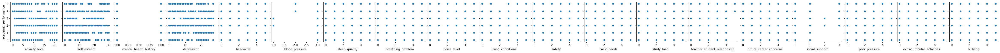

In [8]:
import seaborn as sns
predictors = ['anxiety_level', 'self_esteem', 'mental_health_history', 'depression','headache', 'blood_pressure', 'sleep_quality', 'breathing_problem', 'noise_level', 
            'living_conditions', 'safety', 'basic_needs', 'study_load', 'teacher_student_relationship', 'future_career_concerns','social_support', 'peer_pressure',
            'extracurricular_activities', 'bullying']
factor = ['academic_performance']
sns.pairplot(data=df, y_vars=factor, x_vars=predictors)

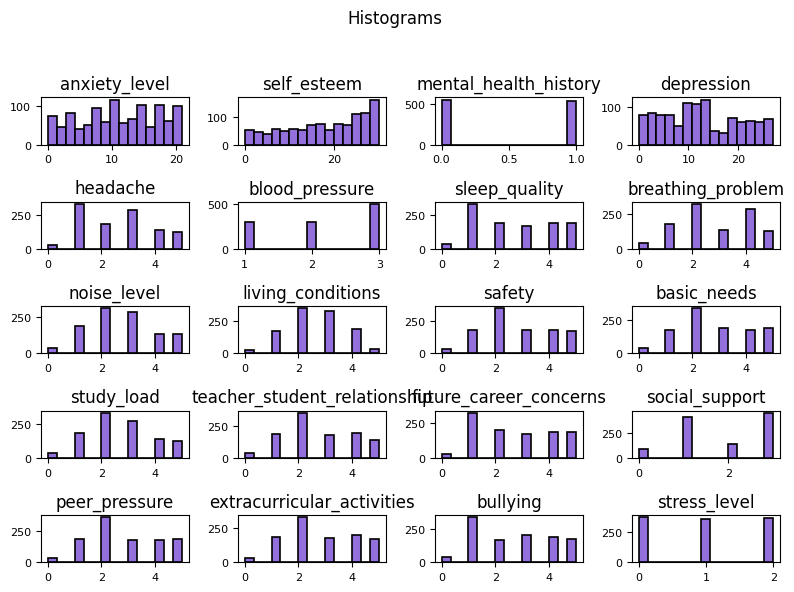

In [38]:
# Create a histogram all feature
subset = df.loc[:, "anxiety_level":"stress_level"]

subset.hist(grid=False, bins=15, color="mediumpurple",ec="black", linewidth=1.2, xlabelsize=8, ylabelsize=8, figsize=(8, 6))
plt.suptitle("Histograms", fontsize=12)
plt.tight_layout(rect=(0,0,1,0.95))
plt.show()

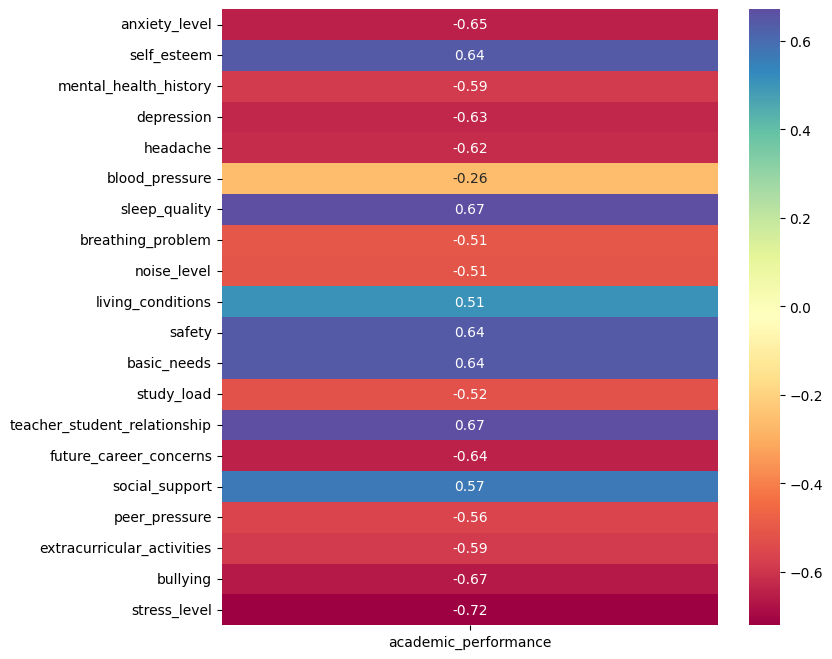

In [32]:
# Create a heat map
correl = df.corr()
plt.figure(figsize = (8,8))
colormap = sns.color_palette("Spectral", as_cmap=True)
sns.heatmap(correl.iloc[:-1,-1:], annot = True, cmap = colormap);

In [11]:
profile = ProfileReport(df, title="Profiling data frame")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]